# BERTopic Implementation on Trigrams

In [ ]:
import nltk

The provided code downloads crucial resources to initialize the Natural Language Toolkit (NLTK). It specifically obtains:

This tokenizer divides a text into a list of sentences by building a model for abbreviation words, collocations, and sentence-starting words using an unsupervised algorithm.
Stopwords: A list of common words (such as 'and,' 'the,' and 'is') in various languages that are typically disregarded during text data processing.
wordnet is a lexical database for the English language that aids in discovering the meanings, synonyms, and antonyms of words. Facilitates lemmatization.

In [ ]:
# Initialize NLTK

# Download the Punkt Tokenizer models for sentence tokenization
nltk.download('punkt')

# Download the list of stopwords to filter out common words that don't carry significant meaning
nltk.download('stopwords')

# Download the WordNet lexical database for lemmatization
nltk.download('wordnet')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

The supplied command uses pip to install the pyLDAvis library. pyLDAvis is a Python library for the interactive visualization of topic models. It is a popular tool for interpreting the topics derived from a Latent Dirichlet Allocation (LDA) analysis, providing a clear and graphical method to comprehend and present the topics in a corpus.

In [2]:
# Install the pyLDAvis library for interactive topic model visualization
!pip install pyLDAvis

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 38.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 93.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.7/12.7 MB 117.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 341.8/341.8 kB 36.4 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.5
    Uninstalling numpy-1.23.5:
      Successfully uninstalled numpy-1.23.5
  Attempting uninstall: pandas
    Found existing installation: pandas 1.5.3
    Uninstalling pandas-1.5.3:
      Successfully uninstalled pandas-1.5.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==1.5.3, but you have pandas 2.1.0 which is incompatible.
numba 0.56.4 requires numpy<1.24,>=1.18, but you have numpy 1.25.2 which is incompatible.
tensorflow 2.13.0 

The provided code imports several essential libraries and modules for data preprocessing and topic modeling:

pandas: A powerful library for data manipulation and analysis.
re: The regular expression module for string operations.
nltk: Natural Language Toolkit, a library for working with human language data.
stopwords: A list of common words that are generally ignored in text data processing.
word_tokenize: A function to split a sentence into individual words.
PorterStemmer: A stemming algorithm.
WordNetLemmatizer: A lemmatization method.
string: A module that contains common string operations.
gensim: A library for topic modeling and document similarity analysis.
corpora: Used for creating a corpus from a list of texts.
models: Provides various topic modeling algorithms.
pyLDAvis.gensim: A module for interactive visualization of topics derived from LDA models using the gensim library.

In [3]:
# Import the pandas library for data manipulation and analysis
import pandas as pd

# Import the regular expression library
import re

# Import tools from NLTK for text processing
from nltk.corpus import stopwords           # Import the list of stopwords
from nltk.tokenize import word_tokenize     # Import the word tokenizer
from nltk.stem import PorterStemmer         # Import the Porter stemming algorithm
from nltk.stem import WordNetLemmatizer     # Import the WordNet lemmatizer

# Import the string module for string operations
import string

# Import the gensim library for topic modeling and document similarity analysis
import gensim
from gensim import corpora, models          # Import tools for creating a corpus and training topic models

# Import the pyLDAvis library for interactive LDA visualization
import pyLDAvis.gensim

In [ ]:
df = pd.read_excel("Whatisloneliness060321.xlsx")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
df_orig = df
df = df.rename(columns={'Q9_Loneliness_Meaning_Qual': 'survey'})

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Data Cleaning and Preprocessing

The provided code performs a series of text preprocessing and feature extraction tasks on a dataset containing survey responses related to loneliness. Here's a summary of the operations:

Library Imports:

pandas: For data manipulation.
spacy: For advanced natural language processing tasks.
nltk: For basic text processing functions like tokenization and n-gram extraction.
stopwords: A list of common words typically excluded from processing.
Spacy Model Loading: The English model (en_core_web_sm) from Spacy is loaded for lemmatization.

Text Cleaning:

Convert text to lowercase.
Remove digits and hyphens.
Remove punctuation and other non-word characters.
Lemmatization: Using Spacy, the text is lemmatized, converting words to their base or dictionary form.

Stopword Removal:

A custom list of additional stopwords related to loneliness is defined.
These stopwords are removed from the lemmatized text.
Feature Extraction:

Bigrams: Pairs of consecutive words.
Trigrams: Triplets of consecutive words.
Both bigrams and trigrams are extracted with and without the removal of stopwords.
Data Cleaning:

Missing values are dropped.
The dataset is filtered to exclude rows with empty strings in specific columns.
Data Overview: The shape, head, and counts of missing values and empty strings in the DataFrame are displayed.

In [ ]:
import pandas as pd
import spacy
from nltk.tokenize import word_tokenize
from nltk.util import bigrams, trigrams
from nltk.corpus import stopwords

# Load the Spacy model
nlp = spacy.load('en_core_web_sm')

# Cleaning function
def clean_text(df, column_name='survey'):
    df['clean_text'] = df[column_name].astype(str).str.lower()
    df['clean_text'] = df['clean_text'].str.replace(r'\d+|-', '', regex=True)
    df['clean_text'] = df['clean_text'].str.replace(r'[^\w\s]', '', regex=True)
    return df

# Define lemmatization function using Spacy
def spacy_lemmatize(text):
    doc = nlp(text)
    return " ".join([token.lemma_ for token in doc])

# Remove stopwords
#stopwords_list = set(stopwords.words('english'))

# Add additional stopwords
additional_stopwords = ['solitude', 'isolation', 'seclusion', 'desolation', 'abandonment',
                       'emptiness', 'alienation', 'forsakenness', 'aloneness', 'withdrawal',
                       'loneliness', 'lonely','alone','isolated','noone','anyone','someone','one','talk']

#stopwords_list.update(additional_stopwords)

#def remove_stopwords(text):
 #   words = word_tokenize(text)
  #  return ' '.join([word for word in words if word not in stopwords_list])

def remove_stopwords(text):
    words = word_tokenize(text)
    return ' '.join([word for word in words if word not in additional_stopwords])

def get_bigrams(text):
    tokens = word_tokenize(text)
    return list(bigrams(tokens))

def get_trigrams(text):
    tokens = word_tokenize(text)
    return list(trigrams(tokens))

df = clean_text(df)
df['lemmatized_text'] = df['clean_text'].apply(spacy_lemmatize)
df['without_stopwords'] = df['lemmatized_text'].apply(remove_stopwords)
df['bigrams'] = df['without_stopwords'].apply(get_bigrams)
df['trigrams'] = df['without_stopwords'].apply(get_trigrams)
df['trigrams_with_stopwords'] = df['lemmatized_text'].apply(get_trigrams)
# Drop missing values
df.dropna(inplace=True)

# Display DataFrame shape, head, and counts of missing values and empty strings
print(df.shape)
print(df.head())
print(df.isna().sum())
print((df == '').sum())

# Filter out rows with empty strings in specified columns
df = df[df['clean_text'] != '']
df = df[df['lemmatized_text'] != '']
df = df[df['without_stopwords'] != '']
df = df[df['bigrams'].astype(str) != '[]']
df = df[df['trigrams'].astype(str) != '[]']
df = df[df['trigrams_with_stopwords'].astype(str) != '[]']

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(45625, 12)
   Idme  gender  groupedage   age  UCLA3itemscale  \
0   203     2.0         2.0  16.0             8.0   
1   237     2.0         2.0  16.0             9.0   
2   545     2.0         2.0  16.0             6.0   
3   565     1.0         2.0  16.0             8.0   
4   658     2.0         2.0  16.0             9.0   

                                              survey  \
0                                                -99   
1                                Makes me feel empty   
2  Not speaking to anyone for days. Being out wit...   
3  I am a very loving generous person but due to ...   
4                                         Unlikeable   

                                          clean_text  \
0                                                      
1                                makes me feel empty   
2  not speaking to anyone for days being out with...   
3  i am a very loving generous person but due to ...   
4                                         unlikeable

In [ ]:
# Use pip to install the BERTopic library for topic modeling with BERT embeddings
!pip install bertopic

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.4/143.4 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 25.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 10.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 kB 10.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Using cached Cython-0.29.36-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.manylinux_2_24_x86_64.whl (1.9 MB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 73.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 70.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.8/294.8 kB 29.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 70.3 MB/s eta 0:00:00
  Preparing metadata (s

In [ ]:
# Convert trigrams in the 'trigrams' column of the DataFrame 'df' into strings.
# Each trigram (a tuple of three words) is joined with underscores.
# If the trigram is not a list (e.g., NaN values), an empty string is added.
# The result is a list of strings, where each string represents a document with trigrams.
docs = [" ".join(["_".join(item) for item in trigram]) if isinstance(trigram, list) else "" for trigram in df['trigrams']]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Import BERTopic, a topic modeling tool that leverages BERT embeddings for creating topics.
from bertopic import BERTopic

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


The code aims to implement topic modeling using the BERTopic library on a set of documents. Specifically, it seeks to:

Leverage BERT embeddings for topic extraction: By using BERT embeddings, the model can capture contextual relationships between words, leading to more coherent and semantically meaningful topics.

Determine the dominant topics in a corpus: The model identifies and assigns the most probable topic to each document in the dataset (docs).

Calculate topic probabilities: For each document, the model computes the probability distribution over the extracted topics, allowing for a nuanced understanding of the document's content.

Limit the number of topics: By setting nr_topics=50, the intention is to extract a maximum of 50 topics from the corpus, ensuring that the topics are broad enough to capture the main themes but limited in number for easier interpretation and analysis.

In [ ]:
# Initialize BERTopic with specified parameters:
# calculate_probabilities: Compute probabilities of topics for each document
# nr_topics: The number of topics to be extracted from the collection of documents
topic_model = BERTopic(calculate_probabilities=True, nr_topics=50)

# Fit the model to the documents (docs) and transform the collection of documents
# into a list of topic IDs and their associated probabilities
topics, probabilities = topic_model.fit_transform(docs)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
pip install wordcloud --upgrade

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In the provided code, various visualization techniques are being employed to understand and interpret the topics extracted from a corpus using the BERTopic model. Here's a breakdown of the steps:

Visualize Topics:

topic_model.visualize_topics(): This visualizes the topics in a 2D space, allowing for an understanding of how topics relate to one another.
Topic Frequencies:

The frequencies of each topic are retrieved using topic_model.get_topic_freq().
Topics labeled as -1 are typically considered as noise or outliers and are filtered out.
The top 10 topics and their associated words are printed.
Bar Chart Visualization:

topic_model.visualize_barchart(): This visualizes the frequency of each topic, providing an understanding of the prominence of topics in the corpus.
Top Words for Each Topic:

A custom function, plot_top_words_bertopic(), is defined and called to plot the top words associated with each topic. This helps in understanding the core essence of each topic.
Word Clouds for Each Topic:

Another custom function, plot_wordclouds_bertopic(), is defined and called to generate word clouds for each topic. Word clouds provide a visually appealing representation of the most significant words in each topic.
Hierarchy Visualization:

topic_model.visualize_hierarchy(): This visualizes the hierarchical structure of topics, showing how topics can be grouped into broader categories.
Bar Chart Visualization (Repeated):

topic_model.visualize_barchart(): The bar chart visualization is called again, though it seems redundant as it was already called earlier in the code.

    Topic  Count
2       0   4810
4       1   1489
12      2    766
16      3    544
5       4    530
0       5    489
11      6    379
15      7    367
9       8    329
25      9    308
Topic 0:
[('surroundbypeople', 0.007243974988923335), ('idonot', 0.006916627889207434), ('besurroundby', 0.006845722023905077), ('afeelingof', 0.004125730562794016), ('onmyown', 0.004064653084558289), ('beina', 0.004057093828196136), ('inacrowd', 0.003583397480203195), ('donothave', 0.0035098361696407144), ('feelasthough', 0.003501507683724758), ('toturnto', 0.003501227401280741)]


Topic 1:
[('notoshare', 0.04110277217996234), ('havetoshare', 0.036457860234428374), ('nothaveto', 0.03433671637255122), ('sharethingwith', 0.02697611426779264), ('tosharething', 0.026030131820903888), ('abletoshare', 0.023474351826308658), ('havenoto', 0.021599509975704773), ('tosharethought', 0.019364420054485288), ('tosharemy', 0.018428888992441238), ('toshareyour', 0.01743365260986804)]


Topic 2:
[('toconfidein', 0.066

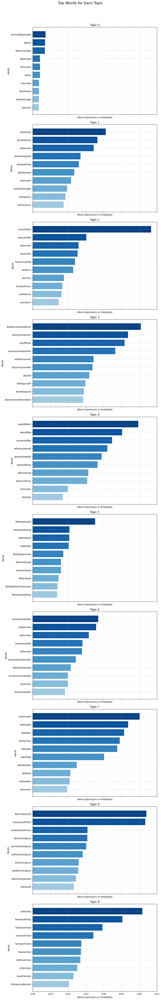

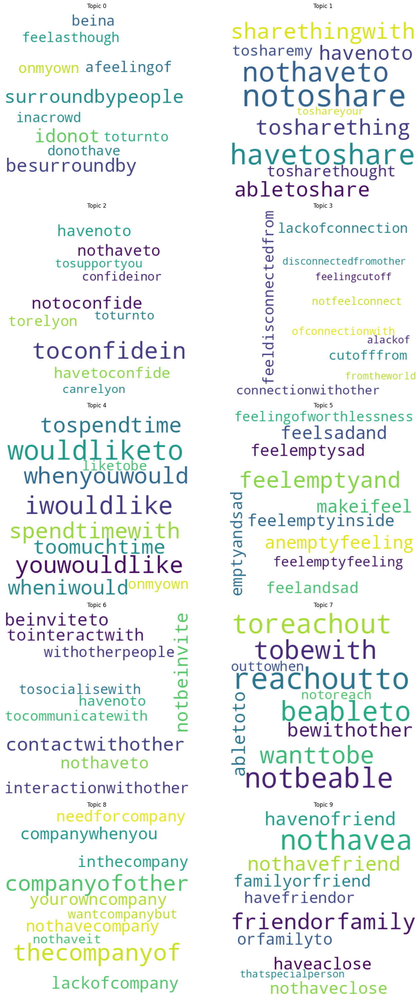

In [ ]:
# Visualize the topics using BERTopic's built-in visualization
topic_model.visualize_topics()

# Retrieve the frequency of each topic
topic_freq = topic_model.get_topic_freq()
# Filter out the noise topic (-1) from the topic frequencies
topic_freq = topic_freq[topic_freq.Topic != -1]
# Display the top 10 topics and their frequencies
print(topic_freq.head(10))

# Print the top words for the top 10 topics
for topic in topic_freq['Topic'][:10].values:
    print(f"Topic {topic}:")
    print(topic_model.get_topic(topic))
    print("\n")

# Visualize the topic frequencies using a bar chart
topic_model.visualize_barchart()

# Import necessary libraries for custom visualizations
import matplotlib.pyplot as plt
import seaborn as sns

# Function to plot the top words for each topic using horizontal bar charts
def plot_top_words_bertopic(topic_model, num_words=15):
    # Retrieve topics excluding the noise topic (-1)
    topics = topic_model.get_topic_freq()['Topic'].values
    topics = [topic for topic in topics if topic != -1]
    # Limit the number of topics for visualization
    num_topics = min(len(topics), 10)
    # Set up the figure for plotting
    fig, axs = plt.subplots(num_topics, 1, figsize=(10, num_topics * 6), sharex=True)
    colors = sns.color_palette('Blues_r', num_words)  # Define a color palette
    # Plot top words for each topic
    for idx, topic in enumerate(topics[:num_topics]):
        top_words = dict(topic_model.get_topic(topic))
        words = list(top_words.keys())[:num_words]
        probs = list(top_words.values())[:num_words]
        axs[idx].barh(words, probs, align='center', color=colors)
        axs[idx].invert_yaxis()
        axs[idx].set_title(f"Topic {topic}")
        axs[idx].grid(True, which='both', linestyle='--', linewidth=0.5)
        axs[idx].set_xlabel('Word Importance or Probability')
        axs[idx].set_ylabel('Words')
    plt.tight_layout()
    plt.suptitle('Top Words for Each Topic', size=16, y=1.02)
    plt.show()

# Call the function to visualize top words
plot_top_words_bertopic(topic_model, num_words=15)

# Import WordCloud for word cloud visualizations
from wordcloud import WordCloud

# Function to plot word clouds for each topic
def plot_wordclouds_bertopic(topic_model, num_words=15):
    topics = topic_model.get_topic_freq()['Topic'].values
    topics = [topic for topic in topics if topic != -1]
    num_topics = min(len(topics), 10)
    fig, axs = plt.subplots((num_topics // 2) + (num_topics % 2), 2, figsize=(15, 6*num_topics//2))
    axs = axs.flatten()
    for idx, topic in enumerate(topics[:num_topics]):
        top_words = dict(topic_model.get_topic(topic))
        words = {word: prob for word, prob in list(top_words.items())[:num_words]}
        wc = WordCloud(background_color="white", width=400, height=400).generate_from_frequencies(words)
        axs[idx].imshow(wc, interpolation='bilinear')
        axs[idx].axis('off')
        axs[idx].set_title(f'Topic {topic}')
    plt.tight_layout()
    plt.show()

# Call the function to visualize word clouds
plot_wordclouds_bertopic(topic_model, num_words=15)

# Visualize the hierarchical structure of topics
topic_model.visualize_hierarchy()

# Visualize the topic frequencies using a bar chart (again)
topic_model.visualize_barchart()

The topic_model.visualize_hierarchy() function is used to visualize the hierarchical structure of topics extracted by the BERTopic model.

In [ ]:
# Visualize the hierarchical structure of topics using BERTopic's built-in visualization
topic_model.visualize_hierarchy()

The two lines of code you provided are related to the hierarchical topic modeling feature of BERTopic.

hierarchical_topics = topic_model.hierarchical_topics(docs):
This line is used to generate hierarchical topics from the documents (docs). Hierarchical topic modeling aims to uncover a multi-level topic structure from a collection of documents. Instead of just identifying individual topics, it tries to find broader categories that encompass multiple related topics, and then further sub-categories within those, creating a tree-like structure of topics.
tree = topic_model.get_topic_tree(hierarchical_topics):
After obtaining the hierarchical topics, this line is used to get the tree structure of those topics. The result, tree, will be a structured representation of topics, where each node represents a topic and has potential child nodes that represent sub-topics. This tree structure can be useful for visualizing the hierarchy or for further analysis where understanding the relationships between topics is crucial.

In [ ]:
# Extract hierarchical topics from the documents using BERTopic
hierarchical_topics = topic_model.hierarchical_topics(docs)

# Convert the hierarchical topics into a tree structure for further analysis or visualization
tree = topic_model.get_topic_tree(hierarchical_topics)

100%|██████████| 48/48 [00:01<00:00, 27.04it/s]


In [ ]:
print(tree)

.
├─lackofconnection_toconnectwith_connectionwithother_feeldisconnectedfrom_alackof
│    ├─thecompanyof_companyofother_notbeunderstand_notfitin_withwhomto
│    │    ├─ihavenever_ibenever_haveneverfeel_notalot_ineverfeel
│    │    │    ├─■──ibenever_ihavenever_haveneverfeel_beneverwith_neverwithmy ── Topic: 39
│    │    │    └─■──notalot_aloti_ihavenever_spendalot_lotoftime ── Topic: 48
│    │    └─thecompanyof_companyofother_notbeunderstand_notfitin_withwhomto
│    │         ├─thecompanyof_companyofother_notbeunderstand_notfitin_withwhomto
│    │         │    ├─thecompanyof_companyofother_notbeunderstand_withwhomto_nothavea
│    │         │    │    ├─notbeunderstand_withwhomto_nothavea_whomtoshare_friendorfamily
│    │         │    │    │    ├─notbeunderstand_whounderstandyou_havewhounderstand_whounderstandi_nowhounderstand
│    │         │    │    │    │    ├─■──nothavearound_havearoundto_aroundwhounderstand_havearoundwho_noaroundwhen ── Topic: 33
│    │         │    │    │    │    └─

In [ ]:
pip install sentence-transformers

The code topic_model.visualize_heatmap() is a method provided by BERTopic to visualize the topic similarity in the form of a heatmap.

In [ ]:
# Visualize the topic similarities using a heatmap
topic_model.visualize_heatmap()

In [5]:
pip install umap-learn


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 3.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 44.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 59.1 MB/s eta 0:00:00
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82807 sha256=73164727d6a1520d76f729046ef6053471596af395b98de2ae849c690f302357
  Stored in directory: /root/.cache/pip/wheels/a0/e8/c6/a37ea663620bd5200ea1ba0907ab3c217042c1d035ef606acc
  Created wheel for pynndescent: filename=pynndescent-0.5.10-py3-none-any.whl size=55615 sha256=dd7543dee3cca456b5eaa9f9038cb52b1799e6e3d0eb8b5878b157e58142d837
  Stored in directory: /root/.cache/pip/wheels/4a/38/5d/f60a40a66a9512b7e5e83517ebc2d1b42d857be97d135f1096
Successfully built umap-learn pynndescent
  Attempting uninstall: numpy
    Found existing installation: numpy 1.25.2
    Uninstalling numpy-1.25

In [6]:
from umap import UMAP


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


The code embeddings = topic_model._extract_embeddings(docs) is extracting the embeddings for the given documents (docs) using the BERTopic model.

In [ ]:
# Extract document embeddings for the provided documents using the BERTopic model
embeddings = topic_model._extract_embeddings(docs)

Extracting the Top 50 Hierarchical Topics: This line assumes that hierarchical_topics is a list containing hierarchical topics. It extracts the first 50 topics and stores them in top_50_hierarchical_topics.

Visualizing Hierarchical Topics with Original Embeddings: This line visualizes the hierarchical topics using the original embeddings. The visualization will show how documents are clustered in the high-dimensional space based on their topics.

Reducing Embeddings Dimensionality with UMAP: UMAP (Uniform Manifold Approximation and Projection) is a dimensionality reduction technique. Here, it's used to reduce the high-dimensional embeddings to 2 dimensions. This is particularly useful for visualization purposes, as it allows us to plot the embeddings on a 2D plane.

Visualizing Hierarchical Topics with Reduced Embeddings: This line visualizes the hierarchical topics using the reduced embeddings from UMAP. The visualization will show how documents are clustered in the 2D space based on their topics

In [ ]:
# Assuming hierarchical_topics is a list, extract the first 50 topics
top_50_hierarchical_topics = hierarchical_topics[:50]

# Visualize the hierarchical structure of the documents using the extracted embeddings
topic_model.visualize_hierarchical_documents(docs, top_50_hierarchical_topics, embeddings=embeddings)

# Use UMAP (Uniform Manifold Approximation and Projection) to reduce the dimensionality of the embeddings for better visualization
reduced_embeddings = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings)

# Visualize the hierarchical structure of the documents using the reduced embeddings
topic_model.visualize_hierarchical_documents(docs, top_50_hierarchical_topics, reduced_embeddings=reduced_embeddings)

UMAP Dimensionality Reduction: UMAP is applied to the high-dimensional embeddings to reduce them to 2 dimensions. The parameters of UMAP are adjusted to potentially provide a clearer visualization.

Visualization: A scatter plot is created to visualize the reduced embeddings. Each point in the plot represents a document, and the color of the point (defined by the colormap 'viridis') could potentially represent some intensity or metric related to the document (e.g., topic intensity). However, the color mapping is not explicitly defined in the provided code.

Styling and Labels:
The subsequent lines of code are dedicated to enhancing the visualization by adding titles, axis labels, grid lines, and a colorbar.

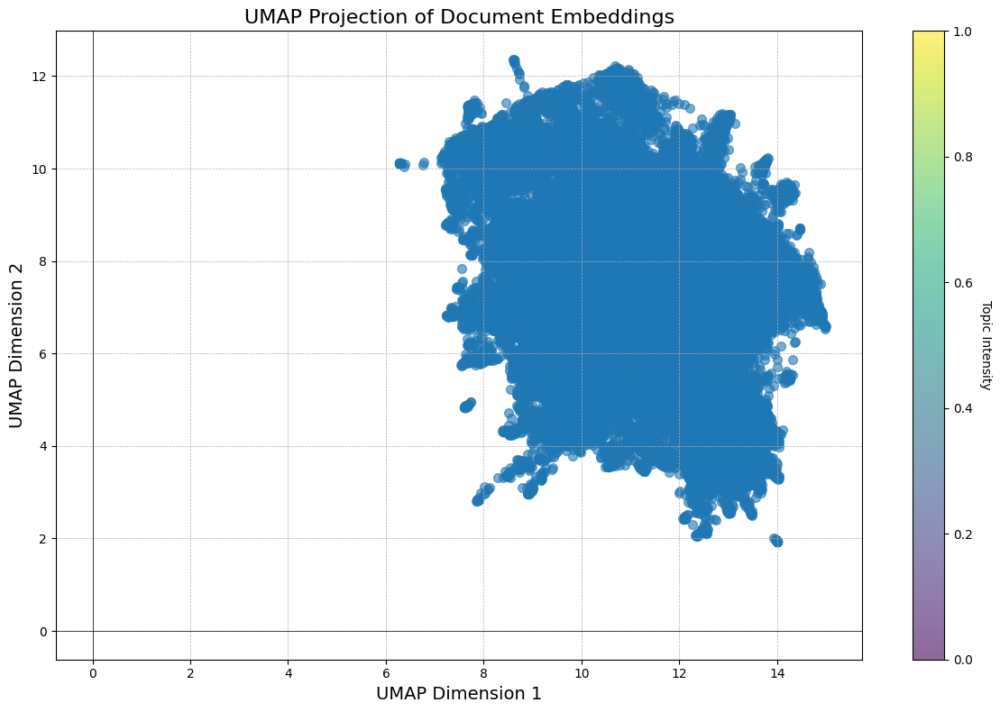

In [32]:
import matplotlib.pyplot as plt
from umap import UMAP

# Use UMAP (Uniform Manifold Approximation and Projection) to reduce the dimensionality of the embeddings
# Adjust UMAP parameters for the reduction
reduced_embeddings = UMAP(n_neighbors=15, n_components=2, min_dist=0.1, metric='cosine').fit_transform(embeddings)

# Set up the visualization
plt.figure(figsize=(12, 8))

# Plot the reduced embeddings as a scatter plot
plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], s=50, cmap='viridis', alpha=0.6)  # s adjusts the point size

# Set the title and axis labels for the plot
plt.title('UMAP Projection of Document Embeddings', fontsize=16)
plt.xlabel('UMAP Dimension 1', fontsize=14)
plt.ylabel('UMAP Dimension 2', fontsize=14)

# Add grid lines, horizontal and vertical lines at 0 for reference
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.axhline(y=0, color='k', linewidth=0.5)
plt.axvline(x=0, color='k', linewidth=0.5)

# Add a colorbar to the plot to represent topic intensity
plt.colorbar().set_label('Topic Intensity', rotation=270, labelpad=15)

# Adjust the layout for better visualization and display the plot
plt.tight_layout()
plt.show()

The code topic_model.visualize_term_rank() is a method call to visualize the ranking of terms for a particular topic model. Here's a breakdown of its purpose:

In [ ]:
# Visualize the importance or rank of terms within topics using BERTopic's built-in function
topic_model.visualize_term_rank()

The code topic_model.visualize_term_rank(log_scale=True) is a method call to visualize the ranking of terms for a particular topic model, with the added parameter to use a logarithmic scale for the visualization.

In [ ]:
# Visualize the importance or rank of terms within topics using BERTopic's built-in function
# The log_scale parameter is set to True to use a logarithmic scale for better visualization of term ranks
topic_model.visualize_term_rank(log_scale=True)

The code topic_model.visualize_topics() is a method call to visualize the topics that have been identified and modeled using the BERTopic library.

In [44]:
# Visualize the topics using the visualize_topics() method
topic_model.visualize_topics()

In [ ]:
topic_representation = topic_model.get_topic_info()

In [ ]:
specific_topics = [4, 20, 24, 15, 40]

for topic in specific_topics:
    topic_values = topic_model.get_topic(topic)
    print(f"Topic {topic}:")
    for word, prob in topic_values:
        print(f"  {word} (probability: {prob:.4f})")
    print("\n")


Topic 4:
  wouldliketo (probability: 0.0595)
  iwouldlike (probability: 0.0504)
  youwouldlike (probability: 0.0447)
  whenyouwould (probability: 0.0421)
  spendtimewith (probability: 0.0388)
  tospendtime (probability: 0.0365)
  wheniwould (probability: 0.0313)
  toomuchtime (probability: 0.0307)
  onmyown (probability: 0.0198)
  liketobe (probability: 0.0169)


Topic 20:
  therestof (probability: 0.1568)
  restofthe (probability: 0.1388)
  fromtherest (probability: 0.1181)
  oftheworld (probability: 0.1134)
  ontheoutside (probability: 0.0944)
  intheworld (probability: 0.0883)
  outsidelookin (probability: 0.0772)
  feelinthe (probability: 0.0743)
  theoutsidelook (probability: 0.0722)
  fromtheworld (probability: 0.0691)


Topic 24:
  alongingfor (probability: 0.1418)
  thelongingfor (probability: 0.0703)
  longingtobe (probability: 0.0695)
  alongingto (probability: 0.0579)
  longingforcompany (probability: 0.0579)
  longingforconnection (probability: 0.0400)
  andlongingfor (prob

In [ ]:
specific_topics = range(1, 43)

for topic in specific_topics:
    topic_values = topic_model.get_topic(topic)
    print(f"Topic {topic}:")
    for word, prob in topic_values:
        print(f"  {word} (probability: {prob:.4f})")
    print("\n")


Topic 1:
  notoshare (probability: 0.0411)
  havetoshare (probability: 0.0365)
  nothaveto (probability: 0.0343)
  sharethingwith (probability: 0.0270)
  tosharething (probability: 0.0260)
  abletoshare (probability: 0.0235)
  havenoto (probability: 0.0216)
  tosharethought (probability: 0.0194)
  tosharemy (probability: 0.0184)
  toshareyour (probability: 0.0174)


Topic 2:
  toconfidein (probability: 0.0667)
  notoconfide (probability: 0.0303)
  nothaveto (probability: 0.0259)
  havenoto (probability: 0.0253)
  havetoconfide (probability: 0.0238)
  torelyon (probability: 0.0228)
  toturnto (probability: 0.0176)
  tosupportyou (probability: 0.0166)
  confideinor (probability: 0.0162)
  canrelyon (probability: 0.0147)


Topic 3:
  feeldisconnectedfrom (probability: 0.0609)
  lackofconnection (probability: 0.0537)
  cutofffrom (probability: 0.0518)
  connectionwithother (probability: 0.0465)
  notfeelconnect (probability: 0.0342)
  ofconnectionwith (probability: 0.0337)
  alackof (proba

In [45]:
specific_topics = {10,12,34}

for topic in specific_topics:
    topic_values = topic_model.get_topic(topic)
    print(f"Topic {topic}:")
    for word, prob in topic_values:
        print(f"  {word} (probability: {prob:.4f})")
    print("\n")

Topic 10:
  havetoto (probability: 0.1593)
  nototo (probability: 0.1589)
  nothaveto (probability: 0.1363)
  dothingwith (probability: 0.1079)
  havenoto (probability: 0.0886)
  todothing (probability: 0.0832)
  nobodytoto (probability: 0.0792)
  havenobodyto (probability: 0.0764)
  havetodo (probability: 0.0544)
  notodo (probability: 0.0544)


Topic 12:
  toturnto (probability: 0.1397)
  nototurn (probability: 0.0924)
  whenyouneed (probability: 0.0909)
  towhenyou (probability: 0.0710)
  havetoturn (probability: 0.0687)
  nothaveto (probability: 0.0599)
  totowhen (probability: 0.0597)
  turntowhen (probability: 0.0561)
  whenineed (probability: 0.0540)
  havenoto (probability: 0.0503)


Topic 34:
  anemptyhouse (probability: 0.2821)
  toanempty (probability: 0.2549)
  comehometo (probability: 0.2189)
  hometoan (probability: 0.2173)
  aboutmyday (probability: 0.0551)
  toaboutmy (probability: 0.0459)
  anemptyflat (probability: 0.0422)
  emptyhousenot (probability: 0.0422)
  havin

In [46]:
specific_topics = {6,9,33,43}

for topic in specific_topics:
    topic_values = topic_model.get_topic(topic)
    print(f"Topic {topic}:")
    for word, prob in topic_values:
        print(f"  {word} (probability: {prob:.4f})")
    print("\n")

Topic 9:
  nothavea (probability: 0.0618)
  friendorfamily (probability: 0.0506)
  nothavefriend (probability: 0.0393)
  havenofriend (probability: 0.0342)
  familyorfriend (probability: 0.0274)
  haveaclose (probability: 0.0272)
  nothaveclose (probability: 0.0268)
  orfamilyto (probability: 0.0251)
  havefriendor (probability: 0.0230)
  thatspecialperson (probability: 0.0205)


Topic 43:
  dayonend (probability: 0.2627)
  notseeor (probability: 0.2129)
  seeorto (probability: 0.1916)
  fordayon (probability: 0.1795)
  ortofor (probability: 0.1765)
  nottoall (probability: 0.1096)
  seeforday (probability: 0.1062)
  afewday (probability: 0.0986)
  forafew (probability: 0.0980)
  toallday (probability: 0.0963)


Topic 6:
  contactwithother (probability: 0.0370)
  notbeinvite (probability: 0.0357)
  beinviteto (probability: 0.0316)
  tointeractwith (probability: 0.0280)
  nothaveto (probability: 0.0278)
  interactionwithother (probability: 0.0242)
  withotherpeople (probability: 0.0215)